In [1]:
!pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)


In [1]:
#install and import all libraries
import nltk
from nltk.tokenize import word_tokenize
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm
import numpy as np

In [2]:
# File paths
file_paths = {
    "business": "/home/sagemaker-user/src/yelp_academic_dataset_business.json",
    "review": "/home/sagemaker-user/src/yelp_academic_dataset_review.json"
}

# Set chunk size
chunk_size = 10000  

# Dictionary to store DataFrames
dfs = {}

# Load each dataset with a progress bar
for name, path in file_paths.items():
    df_list = []
    
    with tqdm(desc=f"Loading {name}", unit="chunk") as pbar:
        try:
            for chunk in pd.read_json(path, lines=True, chunksize=chunk_size):
                df_list.append(chunk)
                pbar.update(1)
        except ValueError as e:
            print(f"Skipping bad lines in {name}: {e}")

    # Combine chunks if data was read
    if df_list:
        dfs[name] = pd.concat(df_list, ignore_index=True)
        print(f"{name} dataset loaded successfully!")
    else:
        print(f"Warning: No valid data found in {name}!")

# Access DataFrames
business_df = dfs.get("business", pd.DataFrame())  # Default to empty DataFrame if failed
review_df = dfs.get("review", pd.DataFrame())
# Print sample data
print("Business Data Sample:\n", business_df.head())
print("Review Data Sample:\n", review_df.head())

Loading business: 16chunk [00:03,  4.01chunk/s]


business dataset loaded successfully!


Loading review: 179chunk [00:32,  5.47chunk/s]


Skipping bad lines in review: Unmatched ''"' when when decoding 'string'
review dataset loaded successfully!
Business Data Sample:
               business_id                      name  \
0  Pns2l4eNsfO8kk83dixA6A  Abby Rappoport, LAC, CMQ   
1  mpf3x-BjTdTEA3yCZrAYPw             The UPS Store   
2  tUFrWirKiKi_TAnsVWINQQ                    Target   
3  MTSW4McQd7CbVtyjqoe9mw        St Honore Pastries   
4  mWMc6_wTdE0EUBKIGXDVfA  Perkiomen Valley Brewery   

                           address           city state postal_code  \
0           1616 Chapala St, Ste 2  Santa Barbara    CA       93101   
1  87 Grasso Plaza Shopping Center         Affton    MO       63123   
2             5255 E Broadway Blvd         Tucson    AZ       85711   
3                      935 Race St   Philadelphia    PA       19107   
4                    101 Walnut St     Green Lane    PA       18054   

    latitude   longitude  stars  review_count  is_open  \
0  34.426679 -119.711197    5.0             7       

In [4]:
business_df

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150341,IUQopTMmYQG-qRtBk-8QnA,Binh's Nails,3388 Gateway Blvd,Edmonton,AB,T6J 5H2,53.468419,-113.492054,3.0,13,1,"{'ByAppointmentOnly': 'False', 'RestaurantsPri...","Nail Salons, Beauty & Spas","{'Monday': '10:0-19:30', 'Tuesday': '10:0-19:3..."
150342,c8GjPIOTGVmIemT7j5_SyQ,Wild Birds Unlimited,2813 Bransford Ave,Nashville,TN,37204,36.115118,-86.766925,4.0,5,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Pets, Nurseries & Gardening, Pet Stores, Hobby...","{'Monday': '9:30-17:30', 'Tuesday': '9:30-17:3..."
150343,_QAMST-NrQobXduilWEqSw,Claire's Boutique,"6020 E 82nd St, Ste 46",Indianapolis,IN,46250,39.908707,-86.065088,3.5,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Shopping, Jewelry, Piercing, Toy Stores, Beaut...",None
150344,mtGm22y5c2UHNXDFAjaPNw,Cyclery & Fitness Center,2472 Troy Rd,Edwardsville,IL,62025,38.782351,-89.950558,4.0,24,1,"{'BusinessParking': '{'garage': False, 'street...","Fitness/Exercise Equipment, Eyewear & Optician...","{'Monday': '9:0-20:0', 'Tuesday': '9:0-20:0', ..."


In [5]:
review_df

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15
...,...,...,...,...,...,...,...,...,...
1789995,r-xj1OqLy8Ul42J81ToUTw,BixRqzmEjRc-G9XtknPEOw,iH3IN3Qg-GMf5BQBlGr4ow,4,3,0,0,This bar is so much better now that they are n...,2017-11-03 09:01:16
1789996,5hoKEuFHEHIAXPQBml9SUw,l792-VmF1_fax2-h2lmg_A,zkUHHsE-ktfrNlhL6CXalQ,5,0,0,0,Simple good inexpensive food and friendly serv...,2019-06-11 16:38:43
1789997,ZbpIaoYtrJJ-Ece2FtIPew,X-ud6SQFcNRmwyHPwtuFEw,WUCm48LSSxeN3mZknFK7Wg,5,0,0,0,"Delicious ice cream - so incredibly creamy, in...",2019-07-04 17:51:34
1789998,VbXIbA4uD6JBAo-DwcWqVQ,wSdFD5GUn6F6ukjvOef6tQ,XqWebxpqQkIgetia5mskEQ,5,4,0,0,I just moved to Philadelphia and I've been on ...,2012-07-31 13:58:07


In [3]:
# Filter for all restaurants in Arizona
restaurant_df = business_df[
    (business_df["state"] == "AZ") &  # Ensure business is in Arizona
    (business_df["city"] == "Tucson") &
    (business_df["categories"].str.contains("Restaurant", na=False))
]

# Merge review data with filtered restaurant data
filtered_reviews_df = review_df.merge(restaurant_df, on="business_id", how="inner")

In [7]:
filtered_reviews_df

,review_id,user_id,business_id,stars_x,useful,funny,cool,text,date,name,...,state,postal_code,latitude,longitude,stars_y,review_count,is_open,attributes,categories,hours
0,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30,Kettle Restaurant,...,AZ,85713,32.207233,-110.980864,3.5,47,1,"{'RestaurantsReservations': 'True', 'BusinessP...","Restaurants, Breakfast & Brunch",None
1,UBp0zWyH60Hmw6Fsasei7w,4Uh27DgGzsp6PqrH913giQ,otQS34_MymijPTdNBoBdCw,4,0,2,0,The bun makes the Sonoran Dog. It's like a snu...,2011-10-27 17:12:05,BK Tacos,...,AZ,85719,32.255834,-110.960560,4.0,492,1,"{'RestaurantsTakeOut': 'True', 'HasTV': 'True'...","Restaurants, Tacos, Mexican, Hot Dogs, Breakfa...","{'Monday': '0:0-0:0', 'Tuesday': '10:0-21:0', ..."
2,ymhbOMW63B_vGaRFR3XT0A,yZdAhQ_KmKuCZmbBy9YDQg,5Ce3lZksYVkCbrihqylVHQ,5,0,0,0,I just started going to Sushi Nara this month ...,2014-07-25 17:56:26,Sushi Nara,...,AZ,85748,32.222552,-110.788132,4.5,159,1,"{'RestaurantsPriceRange2': '2', 'HasTV': 'True...","Sushi Bars, Japanese, Restaurants","{'Monday': '16:30-20:0', 'Tuesday': '16:30-20:..."
3,onlgwy5qGDEzddsrnIvtWg,pYXeL0RCqus2IfhthYCOyA,W7NxQw8UYFR0HLPrI08tvw,4,0,0,0,Don't know what it is but If my tummy's feelin...,2012-02-01 14:21:25,Chipotle Mexican Grill,...,AZ,85712,32.250019,-110.890925,3.0,76,1,"{'RestaurantsPriceRange2': '1', 'GoodForKids':...","Restaurants, Fast Food, Mexican","{'Monday': '0:0-0:0', 'Tuesday': '10:45-22:0',..."
4,ypFqmURIY41F4pWaMW1VrQ,hToW2eoTAYlOcuNz7I73Cg,7L1kXfwU5XM6f6Jxo_L7Yg,5,1,0,0,We've been coming here since I was a kid. The ...,2015-07-03 22:36:04,Casa Molina Del Norte,...,AZ,85719,32.261403,-110.944097,3.0,116,1,"{'RestaurantsPriceRange2': '2', 'HasTV': 'Fals...","Latin American, Mexican, Restaurants","{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61812,FlW_m77Mw54NkdUAT-GH4Q,Wmk0OzoXBeFh3DUj4Zj9yw,q9HeBXQBnXgThOa9DPIhAw,3,3,2,1,It was a beautiful Sunday morning and I decide...,2014-02-02 18:04:16,5 Points Market & Restaurant,...,AZ,85701,32.212200,-110.969090,4.5,557,1,"{'DogsAllowed': 'True', 'WiFi': 'u'free'', 'Wh...","Restaurants, American (New), Delis, Vegetarian...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-14:0', '..."
61813,s6-MmX_xc2CMG1F9h2meNg,V7H1DukNEdDuL-0XB_Zxiw,JkQz12i_Eubd_xQdLLkDxQ,5,1,0,0,Met someone on bumble and we went here on a da...,2018-10-31 01:51:47,HUB Ice Cream Factory,...,AZ,85701,32.222188,-110.967321,4.0,181,1,"{'WheelchairAccessible': 'True', 'RestaurantsT...","Restaurants, Food, Juice Bars & Smoothies, Ice...","{'Monday': '12:0-21:0', 'Tuesday': '12:0-21:0'..."
61814,JVG9-1gY4QkN43Dtskn41Q,mD0468JaE01_CFfEnuIK9Q,c4xAYwO_s8HEmOfCLVAhCA,5,0,0,0,We love this restaurant. The food is always c...,2019-01-14 13:09:26,Ha Long Bay,...,AZ,85715,32.251296,-110.837600,4.0,241,1,"{'RestaurantsReservations': 'True', 'WiFi': ''...","Restaurants, Vietnamese","{'Monday': '15:0-20:30', 'Tuesday': '11:0-20:3..."
61815,eMOP5IsBWBWuMt58YRfDgw,N10Z4XjZodiedqK14mGWKw,2tAi411srrpmMofeAKdACw,5,0,0,0,This little Shop is absolutely adorable. The ...,2019-02-23 04:25:31,Just Breakfast on Silverbell,...,AZ,85743,32.362689,-111.120753,3.5,113,1,"{'RestaurantsTakeOut': 'True', 'WiFi': ''free'...","Coffee & Tea, Breakfast & Brunch, Food, Restau...","{'Monday': '0:0-0:0', 'Tuesday': '6:30-12:0', ..."


In [8]:
filtered_reviews_df.columns

Index(['review_id', 'user_id', 'business_id', 'stars_x', 'useful', 'funny',
       'cool', 'text', 'date', 'name', 'address', 'city', 'state',
       'postal_code', 'latitude', 'longitude', 'stars_y', 'review_count',
       'is_open', 'attributes', 'categories', 'hours'],
      dtype='object')

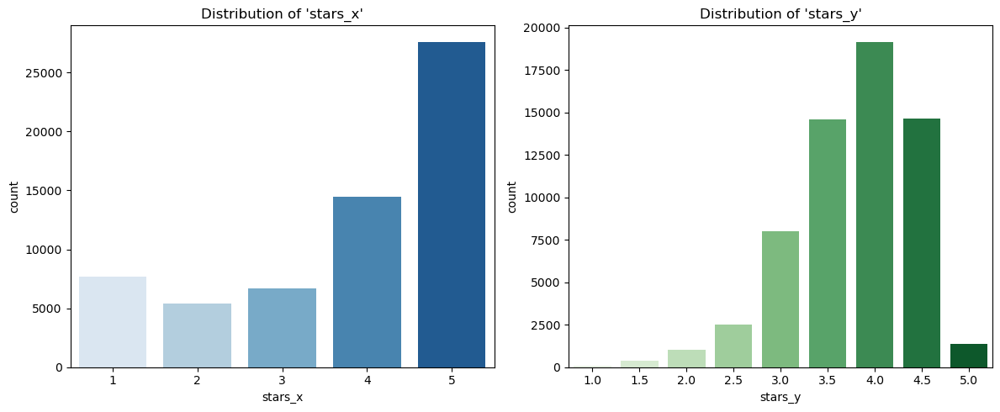

In [9]:
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.countplot(x='stars_x', data=filtered_reviews_df, ax=axes[0], palette='Blues')
axes[0].set_title("Distribution of 'stars_x'")

sns.countplot(x='stars_y', data=filtered_reviews_df, ax=axes[1], palette='Greens')
axes[1].set_title("Distribution of 'stars_y'")

plt.tight_layout()
plt.show()

In [10]:
!pip install wordcloud

  Using cached wordcloud-1.9.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.4 kB)
Using cached wordcloud-1.9.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (547 kB)


[nltk_data] Downloading package punkt to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


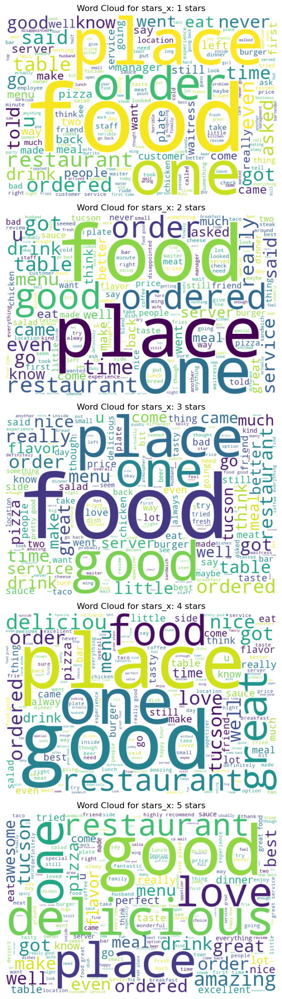

In [11]:
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud

# Download stopwords if not already downloaded
nltk.download('punkt')
nltk.download('stopwords')

# Define stop words
stop_words = set(stopwords.words('english'))

# Function to clean and tokenize text
def tokenize_text(text):
    tokens = word_tokenize(text.lower())  # Convert to lowercase and tokenize
    tokens = [word for word in tokens if word.isalnum() and word not in stop_words]  # Remove stopwords and non-alphanumeric words
    return " ".join(tokens)  # Return cleaned text

# Apply tokenization
filtered_reviews_df['cleaned_text_x'] = filtered_reviews_df['text'].astype(str).apply(tokenize_text)

# Function to generate word cloud for each rating in 'stars_x' (Scrollable)
def plot_scrollable_wordcloud(df, column, title):
    unique_stars = sorted(df[column].unique())  # Get unique star ratings
    fig, axes = plt.subplots(len(unique_stars), 1, figsize=(6, 4 * len(unique_stars)))  # Single column layout

    # If there's only one unique star rating, make axes iterable
    if len(unique_stars) == 1:
        axes = [axes]

    for i, star in enumerate(unique_stars):
        text_data = " ".join(df[df[column] == star]['cleaned_text_x'])
        wordcloud = WordCloud(width=600, height=400, background_color='white', colormap='viridis').generate(text_data)

        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].set_title(f"{title}: {star} stars")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

# Generate scrollable word clouds for 'stars_x'
plot_scrollable_wordcloud(filtered_reviews_df, 'stars_x', 'Word Cloud for stars_x')

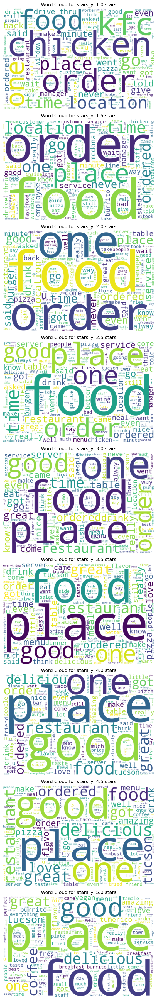

In [12]:
# Apply tokenization to 'stars_y'
filtered_reviews_df['cleaned_text_y'] = filtered_reviews_df['text'].astype(str).apply(tokenize_text)

# Function to generate word cloud for each rating in 'stars_y' (Scrollable)
def plot_scrollable_wordcloud_y(df, column, title):
    unique_stars = sorted(df[column].unique())  # Get unique star ratings
    fig, axes = plt.subplots(len(unique_stars), 1, figsize=(6, 4 * len(unique_stars)))  # Single column layout

    # If there's only one unique star rating, make axes iterable
    if len(unique_stars) == 1:
        axes = [axes]

    for i, star in enumerate(unique_stars):
        text_data = " ".join(df[df[column] == star]['cleaned_text_y'])
        wordcloud = WordCloud(width=600, height=400, background_color='white', colormap='viridis').generate(text_data)

        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].set_title(f"{title}: {star} stars")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

# Generate scrollable word clouds for 'stars_y'
plot_scrollable_wordcloud_y(filtered_reviews_df, 'stars_y', 'Word Cloud for stars_y')

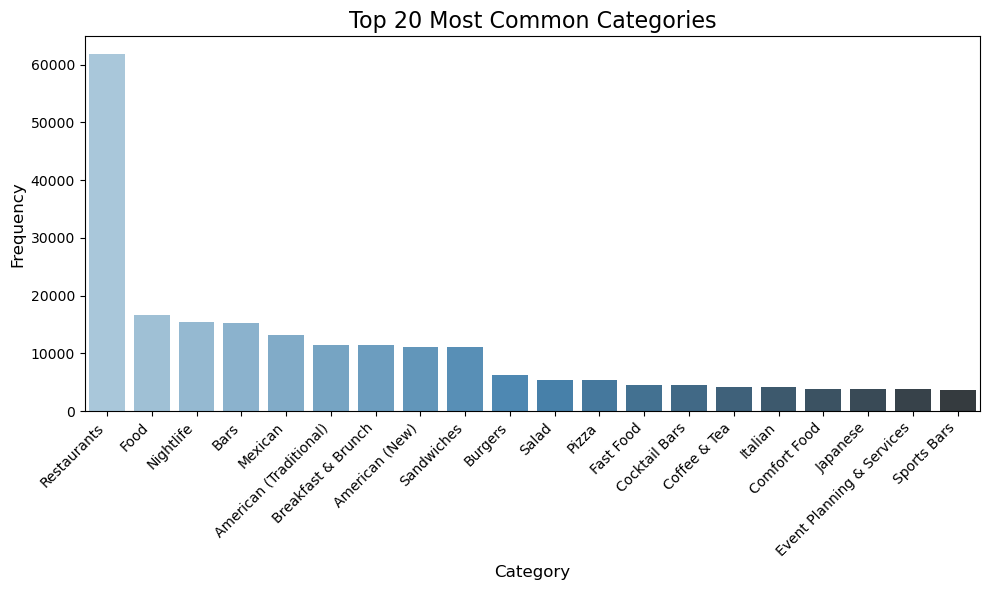

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Split the 'categories' column into individual categories
categories_split = filtered_reviews_df['categories'].apply(lambda x: x.split(',') if isinstance(x, str) else [])

# Step 2: Flatten the list of categories and count the occurrences
all_categories = [category.strip() for sublist in categories_split for category in sublist]
category_counts = pd.Series(all_categories).value_counts()

# Step 3: Visualize the distribution of categories using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=category_counts.head(20).index, y=category_counts.head(20).values, palette='Blues_d')  # Use Seaborn barplot
plt.title("Top 20 Most Common Categories", fontsize=16)
plt.xlabel("Category", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels for readability
plt.tight_layout()
plt.show()

In [14]:
filtered_reviews_df.head()

,review_id,user_id,business_id,stars_x,useful,funny,cool,text,date,name,...,latitude,longitude,stars_y,review_count,is_open,attributes,categories,hours,cleaned_text_x,cleaned_text_y
0,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30,Kettle Restaurant,...,32.207233,-110.980864,3.5,47,1,"{'RestaurantsReservations': 'True', 'BusinessP...","Restaurants, Breakfast & Brunch",None,family diner buffet eclectic assortment large ...,family diner buffet eclectic assortment large ...
1,UBp0zWyH60Hmw6Fsasei7w,4Uh27DgGzsp6PqrH913giQ,otQS34_MymijPTdNBoBdCw,4,0,2,0,The bun makes the Sonoran Dog. It's like a snu...,2011-10-27 17:12:05,BK Tacos,...,32.255834,-110.960560,4.0,492,1,"{'RestaurantsTakeOut': 'True', 'HasTV': 'True'...","Restaurants, Tacos, Mexican, Hot Dogs, Breakfa...","{'Monday': '0:0-0:0', 'Tuesday': '10:0-21:0', ...",bun makes sonoran dog like snuggie pup first s...,bun makes sonoran dog like snuggie pup first s...
2,ymhbOMW63B_vGaRFR3XT0A,yZdAhQ_KmKuCZmbBy9YDQg,5Ce3lZksYVkCbrihqylVHQ,5,0,0,0,I just started going to Sushi Nara this month ...,2014-07-25 17:56:26,Sushi Nara,...,32.222552,-110.788132,4.5,159,1,"{'RestaurantsPriceRange2': '2', 'HasTV': 'True...","Sushi Bars, Japanese, Restaurants","{'Monday': '16:30-20:0', 'Tuesday': '16:30-20:...",started going sushi nara month opened short ti...,started going sushi nara month opened short ti...
3,onlgwy5qGDEzddsrnIvtWg,pYXeL0RCqus2IfhthYCOyA,W7NxQw8UYFR0HLPrI08tvw,4,0,0,0,Don't know what it is but If my tummy's feelin...,2012-02-01 14:21:25,Chipotle Mexican Grill,...,32.250019,-110.890925,3.0,76,1,"{'RestaurantsPriceRange2': '1', 'GoodForKids':...","Restaurants, Fast Food, Mexican","{'Monday': '0:0-0:0', 'Tuesday': '10:45-22:0',...",know tummy feeling icky count chipotle stake f...,know tummy feeling icky count chipotle stake f...
4,ypFqmURIY41F4pWaMW1VrQ,hToW2eoTAYlOcuNz7I73Cg,7L1kXfwU5XM6f6Jxo_L7Yg,5,1,0,0,We've been coming here since I was a kid. The ...,2015-07-03 22:36:04,Casa Molina Del Norte,...,32.261403,-110.944097,3.0,116,1,"{'RestaurantsPriceRange2': '2', 'HasTV': 'Fals...","Latin American, Mexican, Restaurants","{'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...",coming since kid staff watched kids grow perso...,coming since kid staff watched kids grow perso...


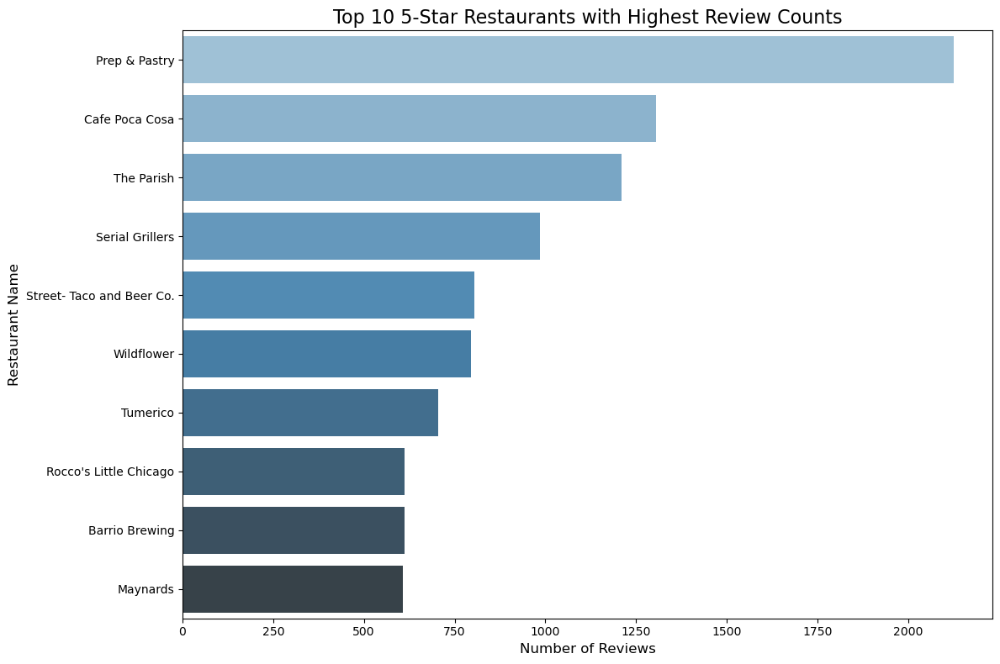

In [15]:
# Step 1: Filter the dataset for 5-star restaurants
five_star_restaurants = filtered_reviews_df[filtered_reviews_df['stars_x'] == 5]

# Step 2: Group by 'business_id' and calculate the sum of reviews per restaurant
top_10_restaurants = five_star_restaurants.groupby('business_id').agg(
    total_reviews=('review_count', 'max'),  # Use 'max' since we want the highest review count per restaurant
    name=('name', 'first'),  # Extract the name of the restaurant
    address=('address', 'first')  # Get the address for better clarity
).reset_index()

# Step 3: Sort by review count in descending order
top_10_restaurants = top_10_restaurants.sort_values(by='total_reviews', ascending=False).head(10)

# Step 4: Display the top 10 restaurants with 5 stars and highest review counts
import matplotlib.pyplot as plt
import seaborn as sns

# Step 5: Visualize the top 10 restaurants
plt.figure(figsize=(12, 8))
sns.barplot(x='total_reviews', y='name', data=top_10_restaurants, palette='Blues_d')

# Adding titles and labels
plt.title('Top 10 5-Star Restaurants with Highest Review Counts', fontsize=16)
plt.xlabel('Number of Reviews', fontsize=12)
plt.ylabel('Restaurant Name', fontsize=12)
plt.tight_layout()

plt.show()

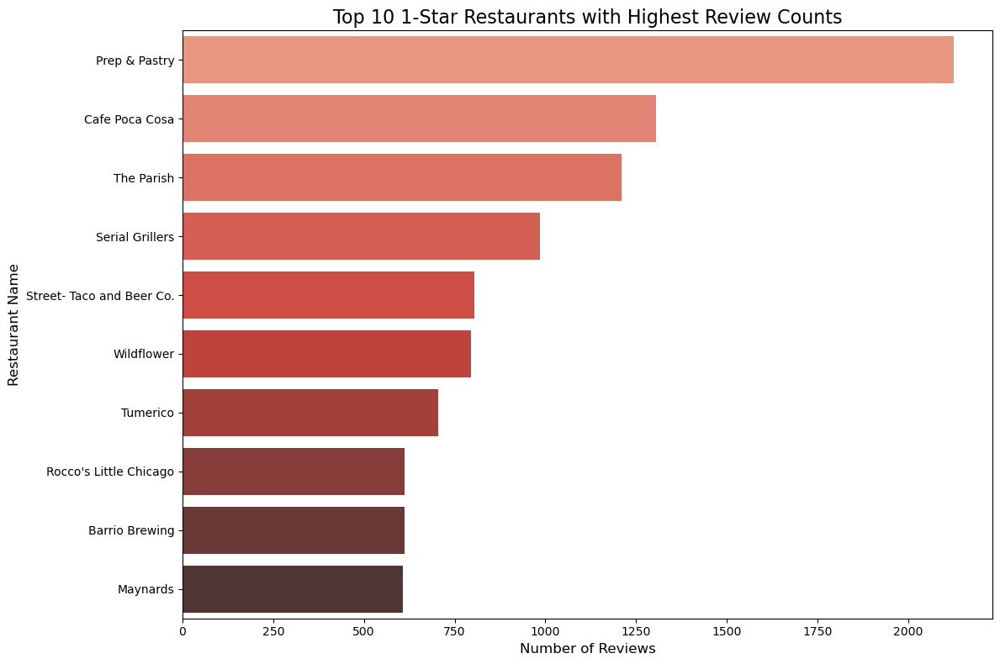

In [16]:
# Step 1: Filter the dataset for 1-star restaurants
one_star_restaurants = filtered_reviews_df[filtered_reviews_df['stars_x'] == 1]

# Step 2: Group by 'business_id' and calculate the sum of reviews per restaurant
top_10_one_star_restaurants = one_star_restaurants.groupby('business_id').agg(
    total_reviews=('review_count', 'max'),  # Use 'max' since we want the highest review count per restaurant
    name=('name', 'first'),  # Extract the name of the restaurant
    address=('address', 'first')  # Get the address for better clarity
).reset_index()

# Step 3: Sort by review count in descending order
top_10_one_star_restaurants = top_10_one_star_restaurants.sort_values(by='total_reviews', ascending=False).head(10)

# Step 4: Display the top 10 restaurants with 1 star and highest review counts
import matplotlib.pyplot as plt
import seaborn as sns

# Step 5: Visualize the top 10 restaurants
plt.figure(figsize=(12, 8))
sns.barplot(x='total_reviews', y='name', data=top_10_one_star_restaurants, palette='Reds_d')

# Adding titles and labels
plt.title('Top 10 1-Star Restaurants with Highest Review Counts', fontsize=16)
plt.xlabel('Number of Reviews', fontsize=12)
plt.ylabel('Restaurant Name', fontsize=12)
plt.tight_layout()

plt.show()


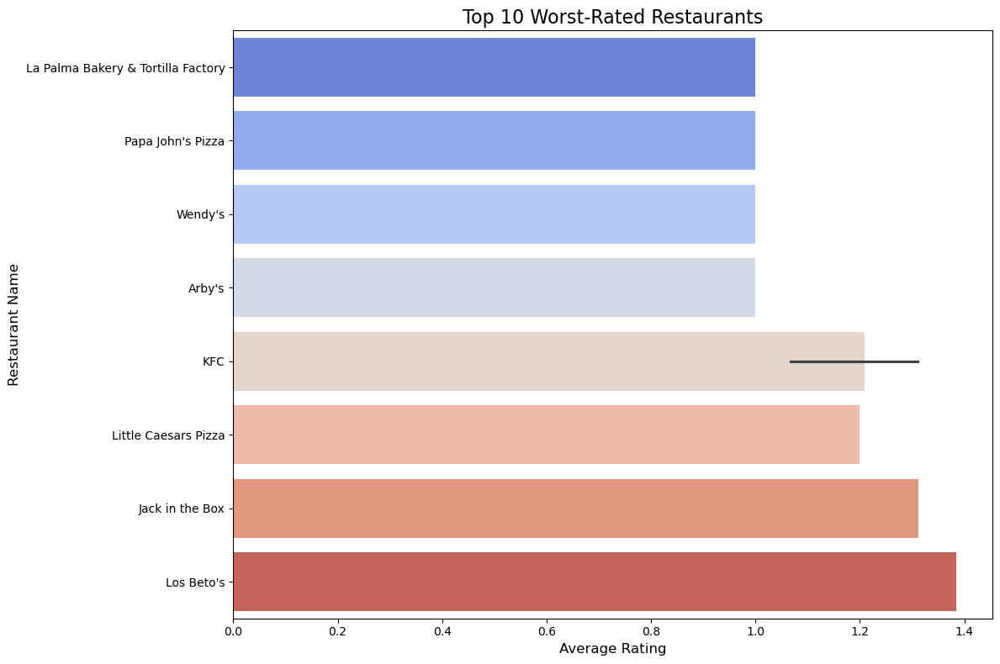

In [17]:
# Step 1: Group by 'business_id' and calculate the average rating for each restaurant
worst_restaurants = filtered_reviews_df.groupby('business_id').agg(
    average_rating=('stars_x', 'mean'),  # Calculate the average rating
    name=('name', 'first'),  # Extract the name of the restaurant
    address=('address', 'first')  # Get the address for better clarity
).reset_index()

# Step 2: Sort by average rating in ascending order to get the lowest rated restaurants
worst_restaurants = worst_restaurants.sort_values(by='average_rating', ascending=True).head(10)

# Step 3: Display the 10 worst-rated restaurants
import matplotlib.pyplot as plt
import seaborn as sns

# Step 4: Visualize the 10 worst-rated restaurants
plt.figure(figsize=(12, 8))
sns.barplot(x='average_rating', y='name', data=worst_restaurants, palette='coolwarm')

# Adding titles and labels
plt.title('Top 10 Worst-Rated Restaurants', fontsize=16)
plt.xlabel('Average Rating', fontsize=12)
plt.ylabel('Restaurant Name', fontsize=12)
plt.tight_layout()

plt.show()

[nltk_data] Downloading package punkt to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


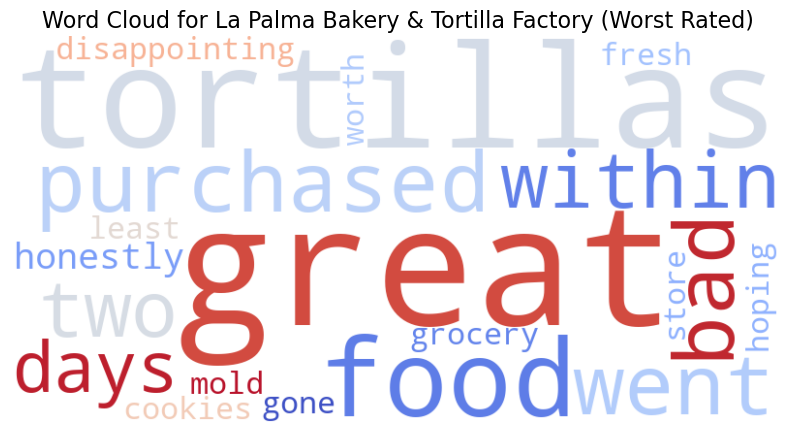

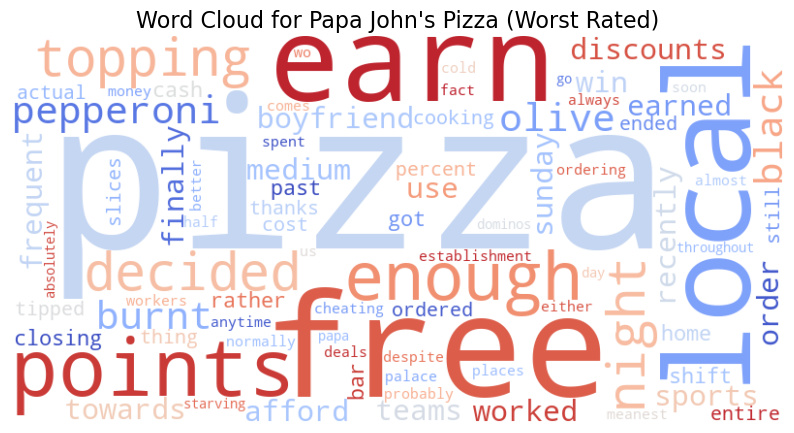

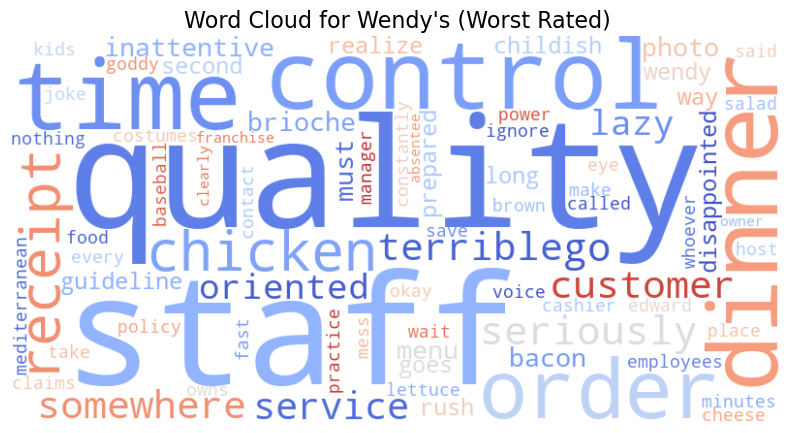

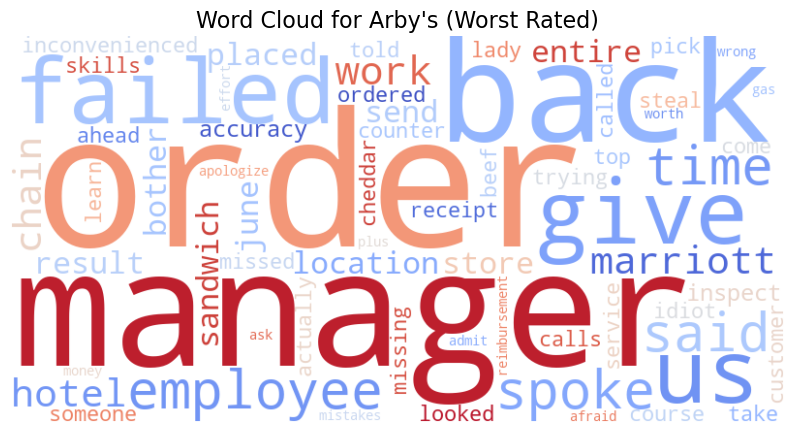

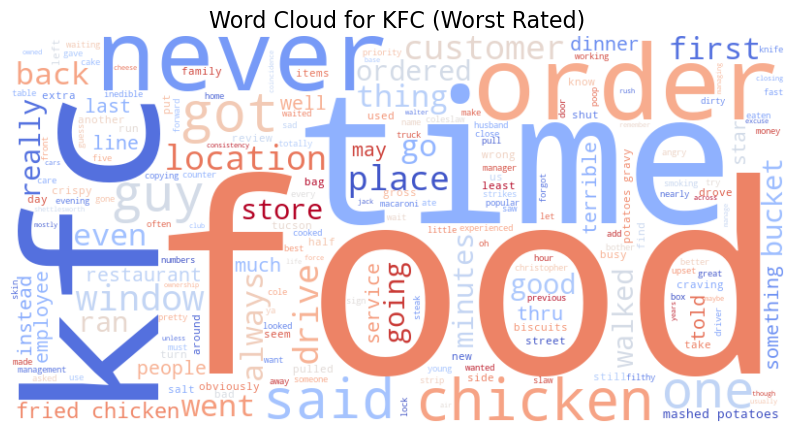

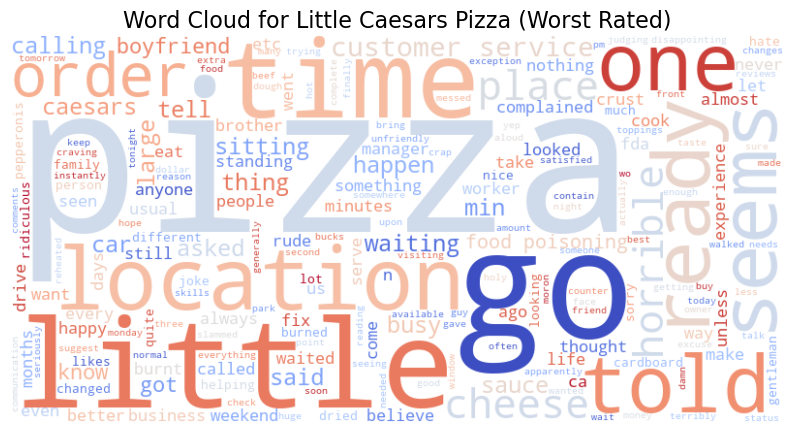

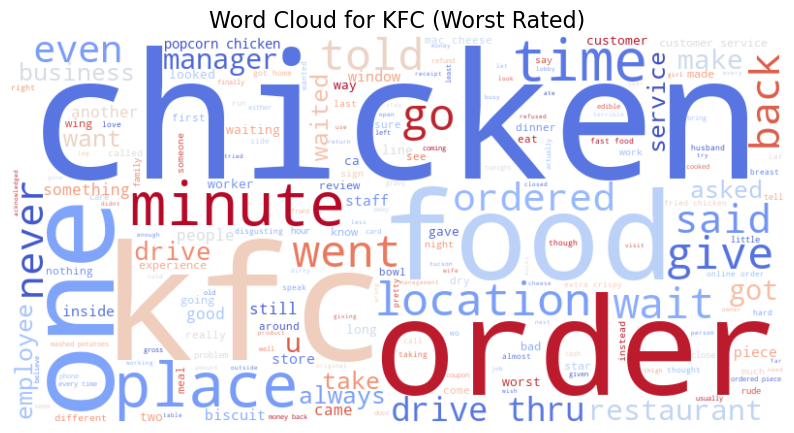

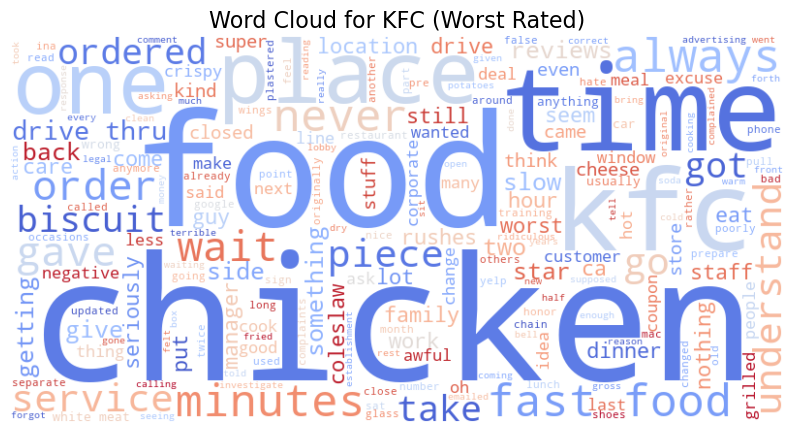

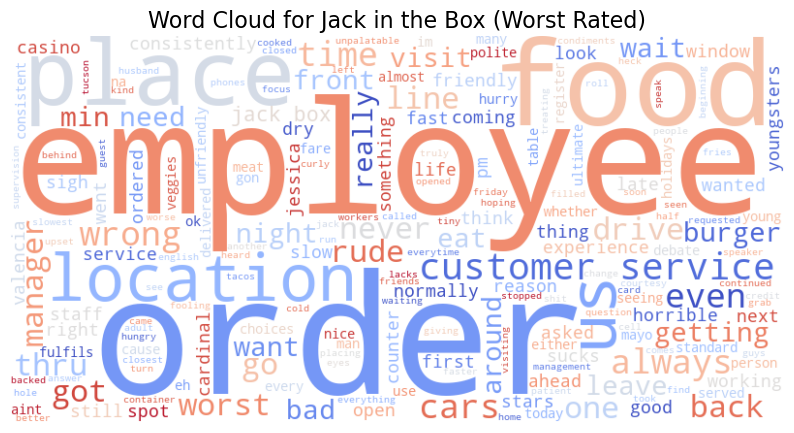

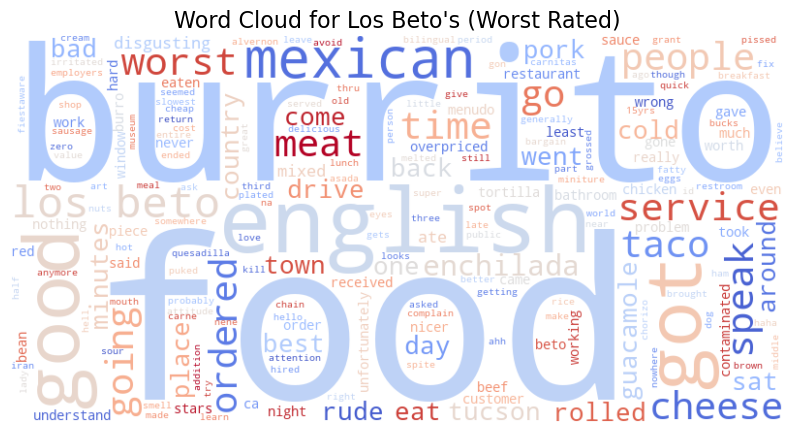

In [18]:
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Download stopwords if not already downloaded
nltk.download('punkt')
nltk.download('stopwords')

# Define stop words
stop_words = set(nltk.corpus.stopwords.words('english'))

# Function to clean and tokenize text
def tokenize_text(text):
    tokens = nltk.word_tokenize(text.lower())  # Convert to lowercase and tokenize
    tokens = [word for word in tokens if word.isalnum() and word not in stop_words]  # Remove stopwords and non-alphanumeric words
    return " ".join(tokens)  # Return cleaned text

# Step 1: Filter reviews for the top 10 worst-rated restaurants
top_10_worst_restaurants = worst_restaurants['business_id'].tolist()
worst_restaurant_reviews = filtered_reviews_df[filtered_reviews_df['business_id'].isin(top_10_worst_restaurants)]

# Step 2: Tokenize the 'text' column for each restaurant's reviews
worst_restaurant_reviews['cleaned_text'] = worst_restaurant_reviews['text'].astype(str).apply(tokenize_text)

# Step 3: Generate word clouds for each of the top 10 worst-rated restaurants
def generate_wordcloud_for_restaurants(df, restaurant_ids):
    for restaurant_id in restaurant_ids:
        restaurant_name = df[df['business_id'] == restaurant_id]['name'].iloc[0]
        text_data = " ".join(df[df['business_id'] == restaurant_id]['cleaned_text'])
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='coolwarm').generate(text_data)
        
        # Step 4: Plot each word cloud
        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for {restaurant_name} (Worst Rated)', fontsize=16)
        plt.axis("off")
        plt.show()

# Generate word clouds for each of the top 10 worst-rated restaurants
generate_wordcloud_for_restaurants(worst_restaurant_reviews, top_10_worst_restaurants)

[nltk_data] Downloading package punkt to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


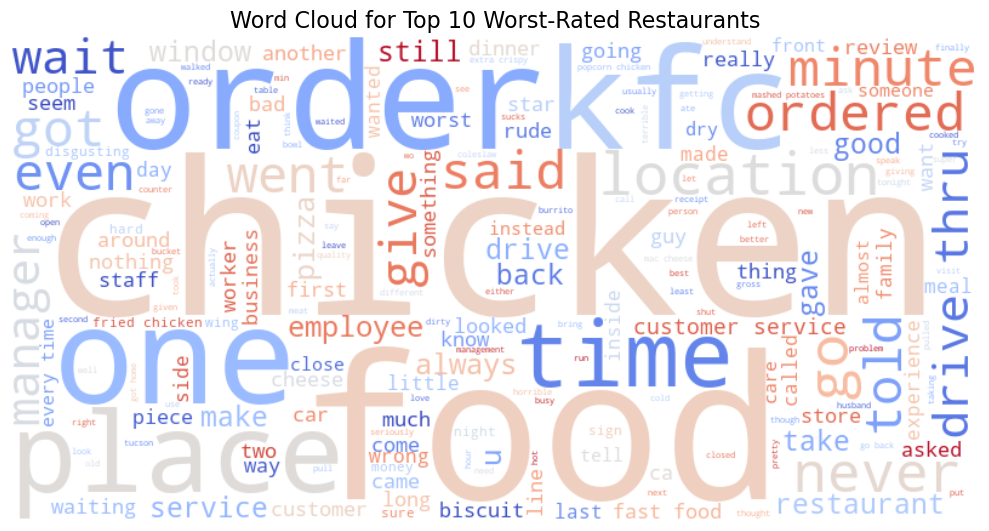

In [20]:
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Download stopwords if not already downloaded
nltk.download('punkt')
nltk.download('stopwords')

# Define stop words
stop_words = set(nltk.corpus.stopwords.words('english'))

# Function to clean and tokenize text
def tokenize_text(text):
    tokens = nltk.word_tokenize(text.lower())  # Convert to lowercase and tokenize
    tokens = [word for word in tokens if word.isalnum() and word not in stop_words]  # Remove stopwords and non-alphanumeric words
    return " ".join(tokens)  # Return cleaned text

# Step 1: Get the top 10 worst-rated restaurants (already computed)
# Assuming `worst_restaurants` DataFrame already contains the top 10 worst-rated restaurants
worst_restaurant_ids = worst_restaurants['business_id']

# Step 2: Filter reviews of the top 10 worst-rated restaurants
worst_reviews = filtered_reviews_df[filtered_reviews_df['business_id'].isin(worst_restaurant_ids)]

# Step 3: Tokenize the reviews (combine reviews for all the worst-rated restaurants)
worst_reviews_text = " ".join(worst_reviews['text'].astype(str).apply(tokenize_text))

# Step 4: Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='coolwarm').generate(worst_reviews_text)

# Step 5: Plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Top 10 Worst-Rated Restaurants', fontsize=16)
plt.axis("off")
plt.tight_layout()

plt.show()

[nltk_data] Downloading package punkt to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


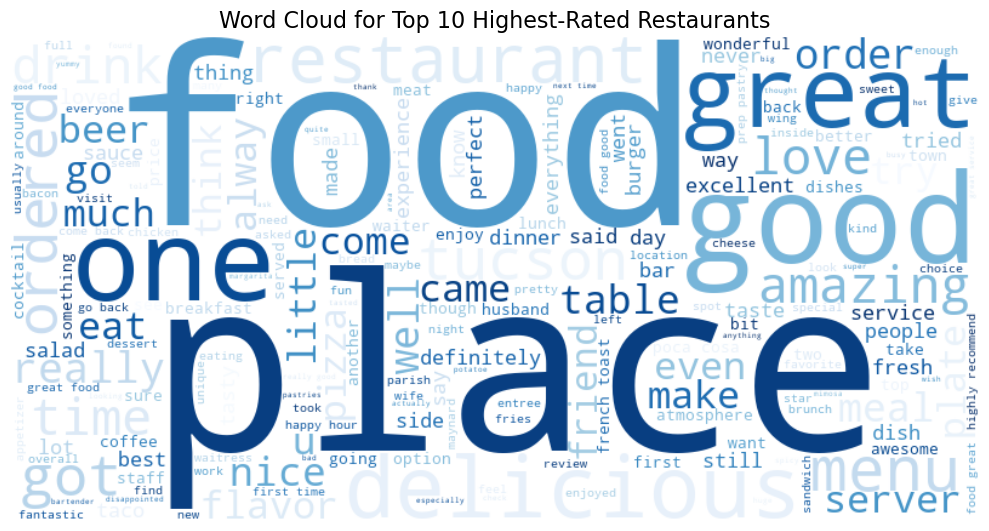

In [19]:
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Download stopwords if not already downloaded
nltk.download('punkt')
nltk.download('stopwords')

# Define stop words
stop_words = set(nltk.corpus.stopwords.words('english'))

# Function to clean and tokenize text
def tokenize_text(text):
    tokens = nltk.word_tokenize(text.lower())  # Convert to lowercase and tokenize
    tokens = [word for word in tokens if word.isalnum() and word not in stop_words]  # Remove stopwords and non-alphanumeric words
    return " ".join(tokens)  # Return cleaned text

# Step 1: Get the top 10 restaurants (highest rated, already computed)
top_10_restaurant_ids = top_10_restaurants['business_id']

# Step 2: Filter reviews of the top 10 highest-rated restaurants
top_10_reviews = filtered_reviews_df[filtered_reviews_df['business_id'].isin(top_10_restaurant_ids)]

# Step 3: Tokenize the reviews (combine reviews for all the top 10 restaurants)
top_10_reviews_text = " ".join(top_10_reviews['text'].astype(str).apply(tokenize_text))

# Step 4: Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Blues').generate(top_10_reviews_text)

# Step 5: Plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Top 10 Highest-Rated Restaurants', fontsize=16)
plt.axis("off")
plt.tight_layout()

plt.show()


[nltk_data] Downloading package punkt to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/sagemaker-
[nltk_data]     user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


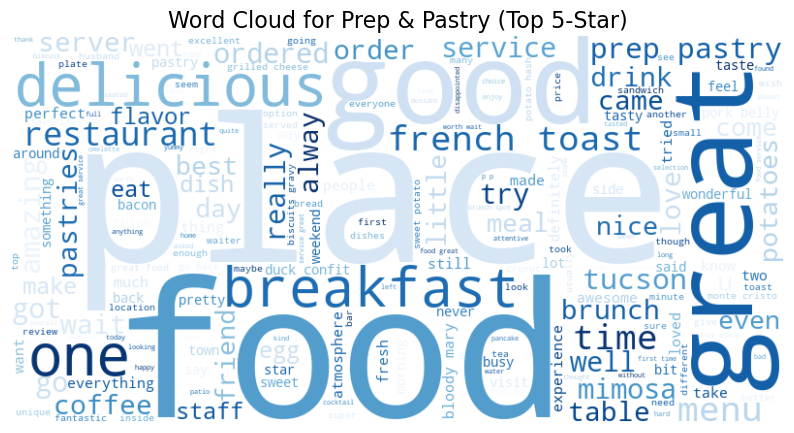

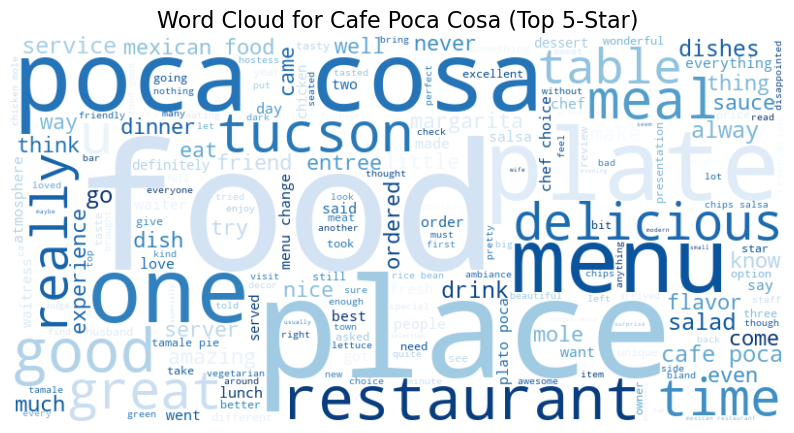

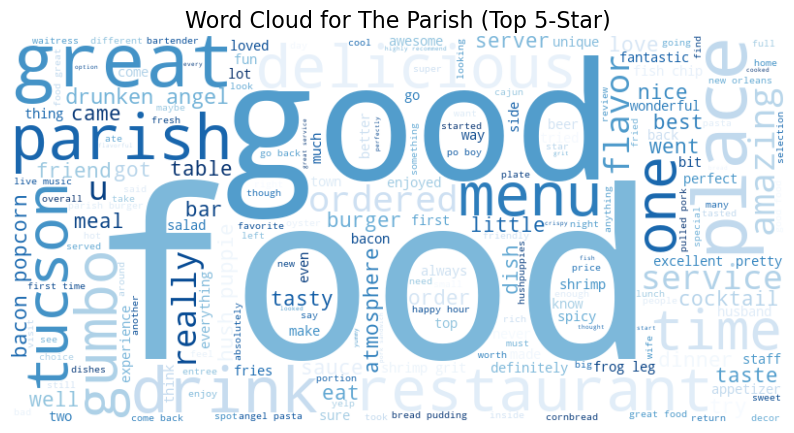

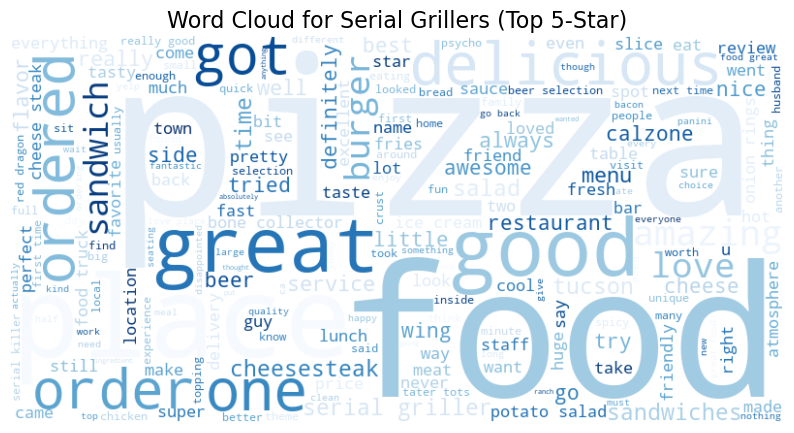

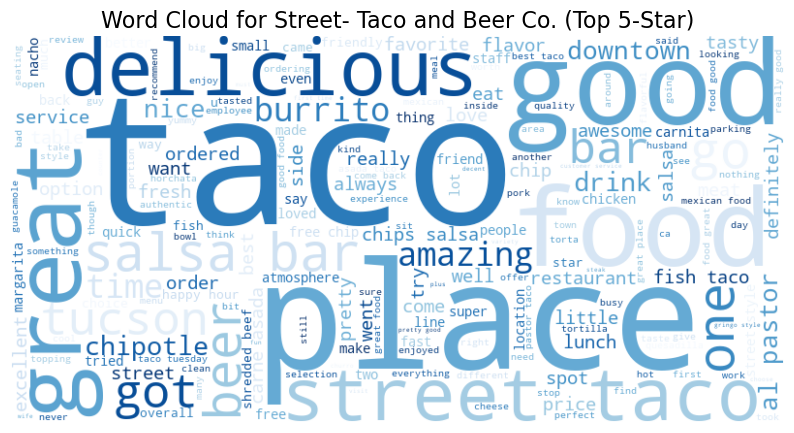

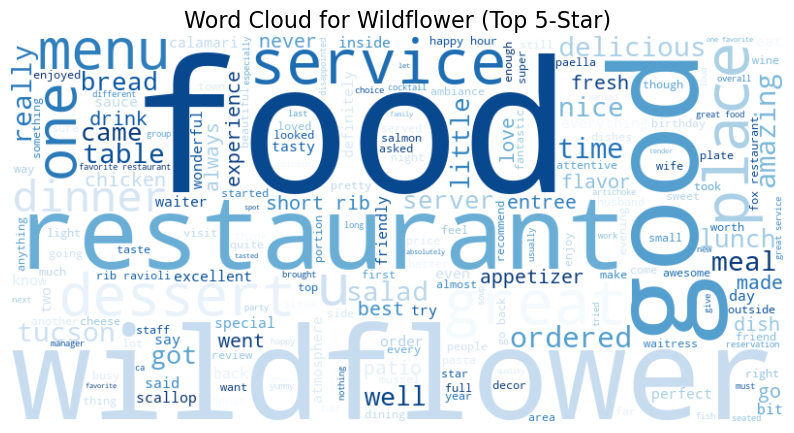

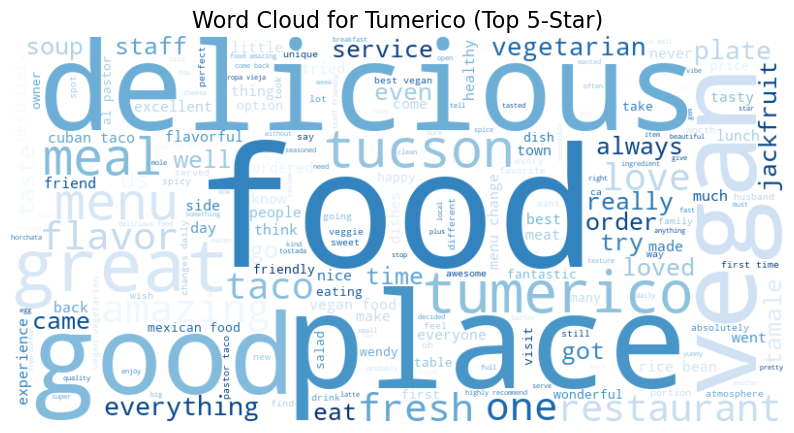

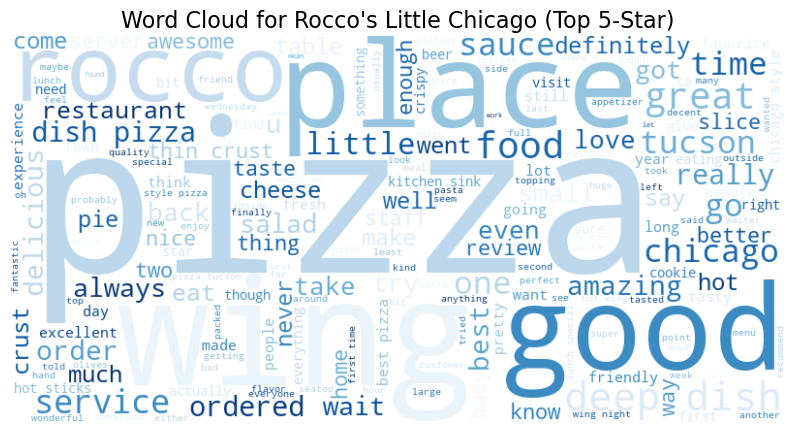

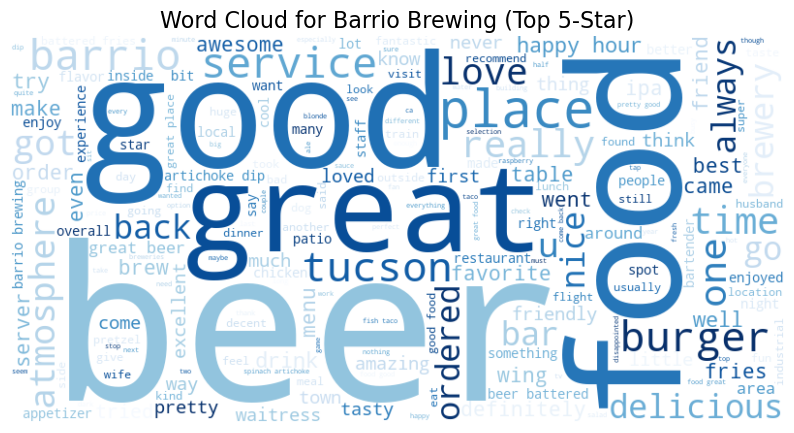

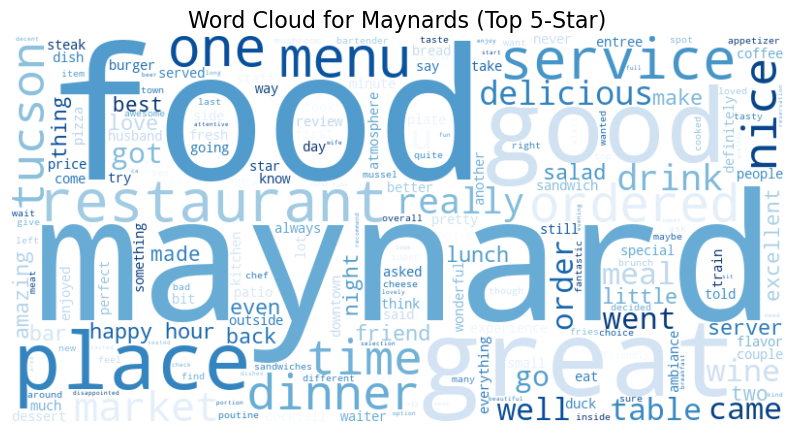

In [22]:
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Download stopwords if not already downloaded
nltk.download('punkt')
nltk.download('stopwords')

# Define stop words
stop_words = set(nltk.corpus.stopwords.words('english'))

# Function to clean and tokenize text
def tokenize_text(text):
    tokens = nltk.word_tokenize(text.lower())  # Convert to lowercase and tokenize
    tokens = [word for word in tokens if word.isalnum() and word not in stop_words]  # Remove stopwords and non-alphanumeric words
    return " ".join(tokens)  # Return cleaned text

# Step 1: Filter reviews for the top 10 5-star restaurants with the highest review counts
top_10_5_star_restaurants = top_10_restaurants['business_id'].tolist()
five_star_reviews = filtered_reviews_df[filtered_reviews_df['business_id'].isin(top_10_5_star_restaurants)]

# Step 2: Tokenize the 'text' column for each restaurant's reviews
five_star_reviews['cleaned_text'] = five_star_reviews['text'].astype(str).apply(tokenize_text)

# Step 3: Generate word clouds for each of the top 10 5-star restaurants
def generate_wordcloud_for_restaurants(df, restaurant_ids):
    for restaurant_id in restaurant_ids:
        restaurant_name = df[df['business_id'] == restaurant_id]['name'].iloc[0]
        text_data = " ".join(df[df['business_id'] == restaurant_id]['cleaned_text'])
        wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Blues').generate(text_data)
        
        # Step 4: Plot each word cloud
        plt.figure(figsize=(10, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for {restaurant_name} (Top 5-Star)', fontsize=16)
        plt.axis("off")
        plt.show()

# Generate word clouds for each of the top 10 5-star restaurants
generate_wordcloud_for_restaurants(five_star_reviews, top_10_5_star_restaurants)

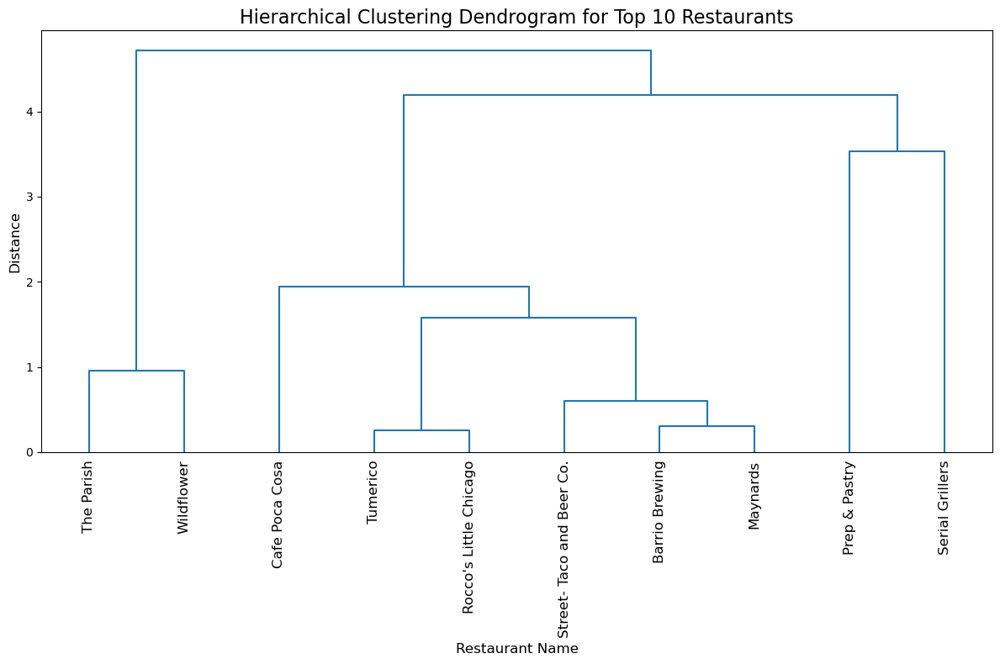

In [23]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Step 1: Select the top 10 restaurants (from previous code)
top_10_restaurants = five_star_restaurants.groupby('business_id').agg(
    total_reviews=('review_count', 'max'),
    name=('name', 'first'),
    address=('address', 'first'),
    latitude=('latitude', 'first'),
    longitude=('longitude', 'first')
).reset_index()

top_10_restaurants = top_10_restaurants.sort_values(by='total_reviews', ascending=False).head(10)

# Step 2: Prepare the data for clustering (latitude, longitude, and review_count)
# We will use the 'latitude', 'longitude', and 'total_reviews' for clustering
clustering_data = top_10_restaurants[['total_reviews', 'latitude', 'longitude']]

# Step 3: Standardize the features
scaler = StandardScaler()
clustering_data_scaled = scaler.fit_transform(clustering_data)

# Step 4: Perform hierarchical clustering using the 'linkage' function
Z = linkage(clustering_data_scaled, method='ward')

# Step 5: Visualize the hierarchical clustering using a dendrogram
plt.figure(figsize=(12, 8))
dendrogram(Z, labels=top_10_restaurants['name'].values, orientation='top', color_threshold=0)
plt.title('Hierarchical Clustering Dendrogram for Top 10 Restaurants', fontsize=16)
plt.xlabel('Restaurant Name', fontsize=12)
plt.ylabel('Distance', fontsize=12)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [4]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
import numpy as np

# Assuming filtered_reviews_df['text'] contains review texts and 'stars_x' contains ratings

2025-03-05 16:55:10.818921: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-05 16:55:10.823316: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-05 16:55:10.837642: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741193710.856530    9603 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741193710.863954    9603 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-05 16:55:10.887590: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [5]:
# Define sentiment labels (1 = Positive, 0 = Negative)
filtered_reviews_df['sentiment'] = (filtered_reviews_df['stars_x'] >= 4).astype(int)

# Extract reviews and labels
texts = filtered_reviews_df['text'].astype(str).tolist()
labels = filtered_reviews_df['sentiment'].values

# Split into training and testing data
train_texts, test_texts, train_labels, test_labels = train_test_split(texts, labels, test_size=0.2, random_state=42)

In [6]:
# Tokenization and Padding
max_vocab_size = 10000
max_length = 200  # Max words per review

# Tokenizer
tokenizer = Tokenizer(num_words=max_vocab_size, oov_token="<OOV>")
tokenizer.fit_on_texts(train_texts)

# Convert text to sequences
train_sequences = tokenizer.texts_to_sequences(train_texts)
test_sequences = tokenizer.texts_to_sequences(test_texts)

# Pad sequences
train_padded = pad_sequences(train_sequences, maxlen=max_length, padding='post', truncating='post')
test_padded = pad_sequences(test_sequences, maxlen=max_length, padding='post', truncating='post')

# Convert labels to numpy array
train_labels = np.array(train_labels)
test_labels = np.array(test_labels)

# Build a Single Neuron Model (Logistic Regression Equivalent)
model = keras.Sequential([
    keras.layers.Input(shape=(max_length,)),
    keras.layers.Embedding(input_dim=max_vocab_size, output_dim=16, input_length=max_length),
    keras.layers.GlobalAveragePooling1D(),  # Reduces dimensions to a single vector
    keras.layers.Dense(1, activation='sigmoid')  # Single Neuron with Sigmoid Activation
])

# Compile the model using Gradient Descent (Adam optimizer)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_padded, train_labels, epochs=10, batch_size=32, validation_data=(test_padded, test_labels))

# Evaluate the model
loss, accuracy = model.evaluate(test_padded, test_labels)
print(f'Test Accuracy: {accuracy * 100:.2f}%')

Epoch 1/10


2025-03-05 16:55:55.831264: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


1546/1546 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7173 - loss: 0.5741 - val_accuracy: 0.8243 - val_loss: 0.4287
Epoch 2/10
1546/1546 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8317 - loss: 0.3876 - val_accuracy: 0.8837 - val_loss: 0.3304
Epoch 3/10
1546/1546 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8805 - loss: 0.3043 - val_accuracy: 0.8830 - val_loss: 0.2941
Epoch 4/10
1546/1546 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8950 - loss: 0.2694 - val_accuracy: 0.8936 - val_loss: 0.2914
Epoch 5/10
1546/1546 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8997 - loss: 0.2566 - val_accuracy: 0.8972 - val_loss: 0.2702
Epoch 6/10
1546/1546 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9091 - loss: 0.2402 - val_accuracy: 0.9028 - val_loss: 0.2658
Epoch 7/10
1546/1546 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9108 - loss: 0.2315 - val_accuracy: 0.8885 - val_loss: 0.2764
Epoch 8/10
1546/1546 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9155 - loss: 0.2240 - val_accurac

In [11]:
# Step 1: Filter reviews for "BK Tacos" and "Los Beto's"
target_restaurants = ["BK Tacos", "Los Beto's"]

# Filter the restaurant data for the specific restaurant names
target_restaurant_df = restaurant_df[restaurant_df["name"].isin(target_restaurants)]

# Merge review data with filtered restaurant data
target_reviews_df = review_df.merge(target_restaurant_df, on="business_id", how="inner")

# Step 2: Tokenize and pad the reviews
target_reviews_texts = target_reviews_df['text'].astype(str).tolist()

# Tokenize the reviews (using the same tokenizer from the training process)
target_reviews_sequences = tokenizer.texts_to_sequences(target_reviews_texts)

# Pad the sequences (using the same padding configuration from the training process)
target_reviews_padded = pad_sequences(target_reviews_sequences, maxlen=max_length, padding='post', truncating='post')

# Step 3: Predict sentiment using the trained model
predictions = model.predict(target_reviews_padded)

# Convert predictions to labels (0 = Negative, 1 = Positive)
predicted_labels = (predictions > 0.5).astype(int)

# Print the predictions for each review
for review, label in zip(target_reviews_texts, predicted_labels):
    sentiment = 'Positive' if label == 1 else 'Negative'
    print(f"Review: {review}\nSentiment: {sentiment}\n")

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Review: The bun makes the Sonoran Dog. It's like a snuggie for the pup. A first, it seems ridiculous and almost like it's going to be too much, exactly like everyone's favorite blanket with sleeves. Too much softness, too much smush, too indulgent.  Wrong. It's warm, soft, chewy, fragrant, and it succeeds where other famed Sonoran Dogs fail. 

The hot dog itself is flavorful, but I would prefer that it or the bacon have a little more bite or snap to better hold their own against the dominant mustard and onions. 

I'm with the masses on the carne asada caramelo. Excellent tortilla, salty, melty cheese, and great carne. 

Super cheap and you can drive through.
Sentiment: Positive

Review: I was told this place is a must for a Sonoran hot dog. I was visiting from out of town and had never had one. It was good, but the whole Sonoran hot dog isn't really my thing (too many components for me) so I can't say it was great. The guacamole on the other hand